In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

In [2]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (24,12)

![title](../database.png)

# Questions to ask in this notebook:
<ol>
<li>Which products receive most positive reviews?</li>
<li>Discovering the products categories that are more prone to customer dissatisfaction?</li>
<li>Is there any relation between the amount of items bought and the score?</li>
<li>Is there any relation between total price and score?</li>
</ol>

## Loading reviews dataset

In [3]:
dt_reviews = pd.read_csv("../dataset/olist_order_reviews_dataset.csv", index_col=0)

- <b>review_id</b>: unique review identifier
- <b>order_id</b>: unique order identifier
- <b>review_score</b>: Note ranging from 1 to 5 given by the customer on a satisfaction survey.
- <b>review_comment_title</b>: Comment title from the review left by the customer, in Portuguese.
- <b>review_comment_message</b>: Comment message from the review left by the customer, in Portuguese.
- <b>review_creation_date</b>: Shows the date in which the satisfaction survey was sent to the customer.
- <b>review_answer_timestamp</b>: Shows satisfaction survey answer timestamp.

In [4]:
dt_reviews.head()

,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
review_id,,,,,,
7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


## Loading order_items dataset

In [5]:
dt_order_items = pd.read_csv("../dataset/olist_order_items_dataset.csv", index_col=0)

- <b>order_id</b>: order unique identifier
- <b>order_item_id</b>: sequential number identifying number of items included in the same order.
- <b>product_id</b>: product unique identifier
- <b>seller_id</b>: seller unique identifier
- <b>shipping_limit_date</b>: Shows the seller shipping limit date for handling the order over to the logistic partner.
- <b>price</b>: item price
- <b>freight_value</b>: item freight value item (if an order has more than one item the freight value is splitted between items)

In [6]:
dt_order_items.head()

,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
order_id,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


## Loading products dataset

In [7]:
dt_products = pd.read_csv("../dataset/olist_products_dataset.csv", index_col=0)

- <b>product_id'</b>: unique product identifier
- <b>product_category_name'</b>: root category of product, in Portuguese.
- <b>product_name_lenght'</b>: number of characters extracted from the product name.
- <b>product_description_lenght'</b>: number of characters extracted from the product description.
- <b>product_photos_qty'</b>: number of product published photos
- <b>product_weight_g'</b>: product weight measured in grams.
- <b>product_length_cm'</b>: product length measured in centimeters.
- <b>product_height_cm'</b>: product height measured in centimeters.
- <b>product_width_cm</b>: product width measured in centimeters.

In [8]:
dt_products.head()

,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
product_id,,,,,,,,
1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


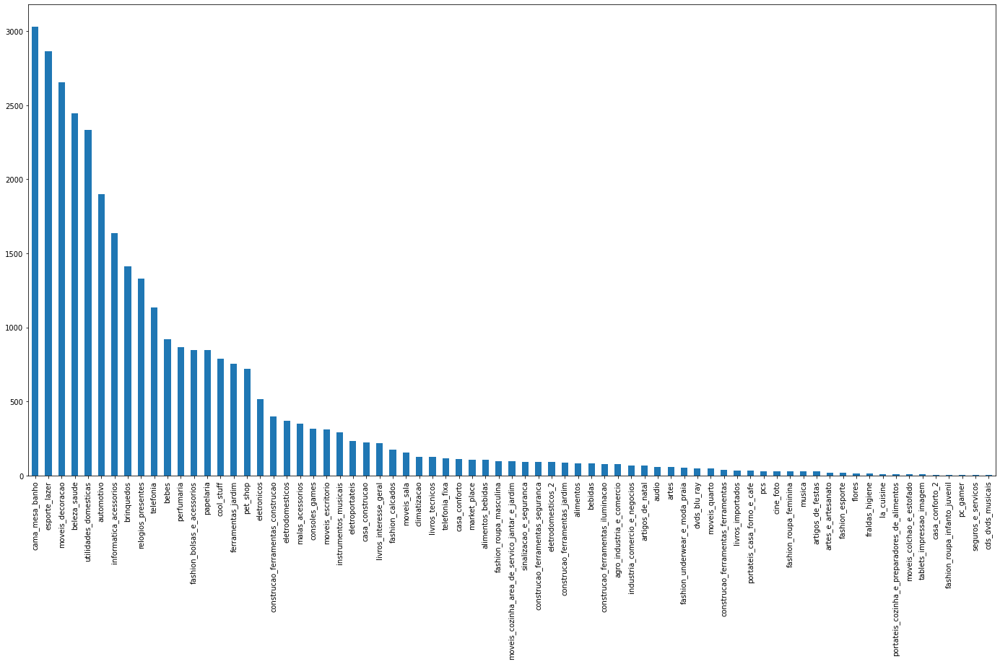

In [9]:
dt_products['product_category_name'].value_counts().plot.bar(figsize=(24,12))

In [10]:
order_n_product_class = pd.merge(dt_order_items,dt_products['product_category_name'],left_on='product_id', right_index=True)
order_n_product_class

,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name
order_id,,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,cool_stuff
130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,cool_stuff
532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,cool_stuff
6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:08,58.9,16.17,cool_stuff
7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-16 22:05:11,58.9,13.29,cool_stuff
...,...,...,...,...,...,...,...
ffebd80e3291e811c308365936897efd,1,4cc4d02efc8f249c13355147fb44e34d,d1c7fa84e48cfa21a0e595167c1c500e,2018-07-18 20:23:55,129.9,51.20,ferramentas_jardim
ffee31fb4b5e35c9123608015637c495,1,b10ecf8e33aaaea419a9fa860ea80fb5,0241d4d5d36f10f80c644447315af0bd,2018-08-21 10:10:11,99.0,13.52,moveis_decoracao
fff7c4452f050315db1b3f24d9df5fcd,1,dd469c03ad67e201bc2179ef077dcd48,7e93a43ef30c4f03f38b393420bc753a,2017-06-07 17:05:23,736.0,20.91,relogios_presentes


In [11]:
scores = dt_reviews.groupby('order_id').mean()
order_n_product_class_n_review = pd.merge(order_n_product_class,scores,left_index=True, right_index=True)
order_n_product_class_n_review

,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,review_score
order_id,,,,,,,,
00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,cool_stuff,5.0
00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,pet_shop,4.0
000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,moveis_decoracao,5.0
00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,perfumaria,4.0
00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,ferramentas_jardim,5.0
...,...,...,...,...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,utilidades_domesticas,5.0
fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,informatica_acessorios,5.0
fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,esporte_lazer,5.0


In [12]:
order_n_product_class_n_review.loc['5a3b1c29a49756e75f1ef513383c0c12']

,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,review_score
order_id,,,,,,,,
5a3b1c29a49756e75f1ef513383c0c12,8,e95fb3a80ca294f39de925b6428f3a32,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,78.90,7.98,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,9,e95fb3a80ca294f39de925b6428f3a32,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,78.90,7.98,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,1,99444c1e11fc38755dae86f5c67d3d1a,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,49.99,7.10,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,5,99444c1e11fc38755dae86f5c67d3d1a,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,49.99,7.10,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,2,17d8b8e9c21ec0fc5b33724e32fe422e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,58.90,2.66,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,4,6a0713a63e990052795623e76cc2995e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,72.90,2.66,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,3,399f54c06661d06ca45c6e24ed238e0e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,61.90,11.98,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,6,399f54c06661d06ca45c6e24ed238e0e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,61.90,11.98,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,11,399f54c06661d06ca45c6e24ed238e0e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,61.90,11.98,cama_mesa_banho,1.0


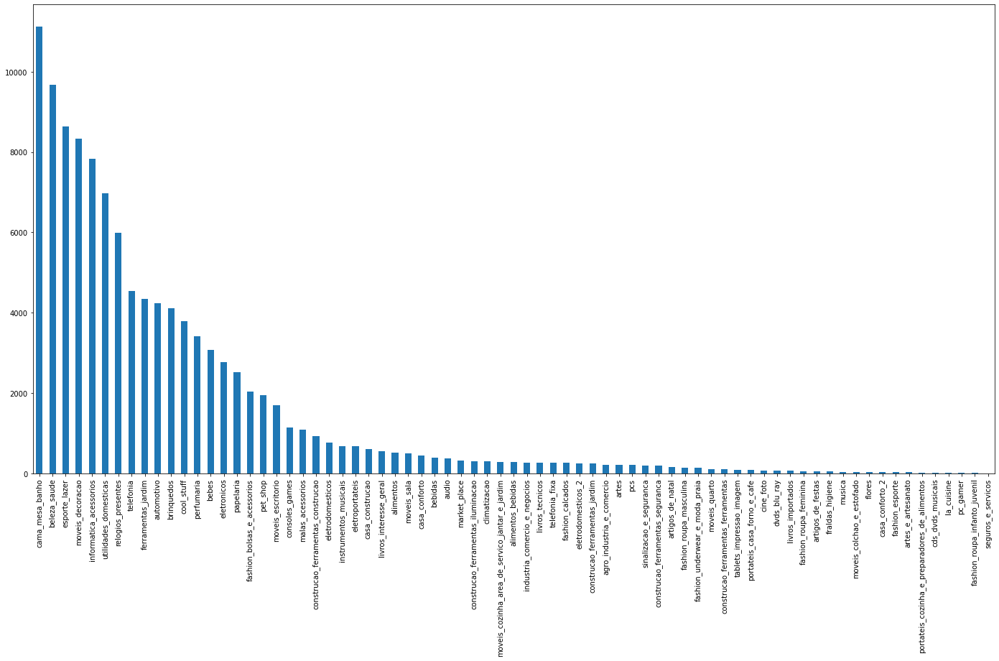

In [13]:
order_n_product_class_n_review['product_category_name'].value_counts().plot.bar(figsize=(24,12))

In [14]:
products_mean_data = order_n_product_class_n_review.loc[:,['review_score','price','freight_value','product_category_name']].groupby('product_category_name').mean()
products_mean_data

,review_score,price,freight_value
product_category_name,,,
agro_industria_e_comercio,4.000000,342.124858,27.564151
alimentos,4.145098,57.634137,14.256922
alimentos_bebidas,4.300360,54.602446,16.215791
artes,3.918660,115.802105,19.354880
artes_e_artesanato,4.125000,75.583750,15.422083
...,...,...,...
sinalizacao_e_seguranca,4.070352,108.086583,32.702613
tablets_impressao_imagem,4.048193,90.703735,14.773494
telefonia,3.934653,71.213978,15.669041


In [15]:
mean_score_per_product = products_mean_data[['review_score']]
mean_score_per_product.sort_values('review_score')

,review_score
product_category_name,
seguros_e_servicos,2.500000
fraldas_higiene,3.256410
portateis_cozinha_e_preparadores_de_alimentos,3.266667
pc_gamer,3.333333
casa_conforto_2,3.366667
...,...
construcao_ferramentas_ferramentas,4.359223
livros_importados,4.400000
livros_interesse_geral,4.439421


In [16]:
order_amout_per_product = order_n_product_class_n_review['product_category_name'].value_counts()
order_amout_per_product

cama_mesa_banho                  11115
beleza_saude                      9670
esporte_lazer                     8641
moveis_decoracao                  8334
informatica_acessorios            7827
                                 ...  
cds_dvds_musicais                   14
la_cuisine                          14
pc_gamer                             9
fashion_roupa_infanto_juvenil        8
seguros_e_servicos                   2
Name: product_category_name, Length: 73, dtype: int64

In [17]:
mean_score_per_product = pd.merge(mean_score_per_product,order_amout_per_product,left_index=True,right_index=True)
mean_score_per_product

,review_score,product_category_name
agro_industria_e_comercio,4.000000,212
alimentos,4.145098,510
alimentos_bebidas,4.300360,278
artes,3.918660,209
artes_e_artesanato,4.125000,24
...,...,...
sinalizacao_e_seguranca,4.070352,199
tablets_impressao_imagem,4.048193,83
telefonia,3.934653,4545
telefonia_fixa,3.670455,264


In [18]:
mean_score_per_product.rename(columns={'product_category_name':'amount_of_orders'},inplace=True)
mean_score_per_product

,review_score,amount_of_orders
agro_industria_e_comercio,4.000000,212
alimentos,4.145098,510
alimentos_bebidas,4.300360,278
artes,3.918660,209
artes_e_artesanato,4.125000,24
...,...,...
sinalizacao_e_seguranca,4.070352,199
tablets_impressao_imagem,4.048193,83
telefonia,3.934653,4545
telefonia_fixa,3.670455,264


In [19]:
(mean_score_per_product['review_score']/mean_score_per_product['review_score'].max()).max()

1.0

In [20]:
mean_score_per_product['review_score']/mean_score_per_product['review_score'].max()

agro_industria_e_comercio    0.861538
alimentos                    0.892790
alimentos_bebidas            0.926231
artes                        0.844019
artes_e_artesanato           0.888462
                               ...   
sinalizacao_e_seguranca      0.876691
tablets_impressao_imagem     0.871918
telefonia                    0.847464
telefonia_fixa               0.790559
utilidades_domesticas        0.870075
Name: review_score, Length: 73, dtype: float64

In [21]:
mean_score_per_product.sort_values('review_score',ascending=False)

,review_score,amount_of_orders
cds_dvds_musicais,4.642857,14
fashion_roupa_infanto_juvenil,4.500000,8
livros_interesse_geral,4.439421,553
livros_importados,4.400000,60
construcao_ferramentas_ferramentas,4.359223,103
...,...,...
casa_conforto_2,3.366667,30
pc_gamer,3.333333,9
portateis_cozinha_e_preparadores_de_alimentos,3.266667,15
fraldas_higiene,3.256410,39


In [22]:
mean_score_per_product = mean_score_per_product.sort_values('amount_of_orders',ascending=False)

In [23]:
fig = px.bar(mean_score_per_product.iloc[:20,:].reset_index(), x='index', y='amount_of_orders',
             hover_data=['review_score', 'amount_of_orders'], color='review_score',
             labels={'amount_of_orders':'Quantidade de pedidos','index':'Tipo de produto'}, height=400)
fig.show()

In [24]:
fig = px.bar(mean_score_per_product.reset_index().sort_values('review_score',ascending=False), x='index', y='review_score',
             hover_data=['review_score', 'amount_of_orders'], color='amount_of_orders',
             labels={'amount_of_orders':'Quantidade de pedidos'}, height=400)
fig.show()

# 1. Which products receive most positive reviews?
## R: Papelaria e Pet shop
# 2. Which products categories that are more prone to customer dissatisfaction?
## R: Moveis de escritorio

In [53]:
data = mean_score_per_product.iloc[:20,:]
index_dict = {}
for index_name in data.index:
    index_dict[index_name] = index_name.replace('_',' ')

data = data.rename(index=index_dict)
data = data.reset_index().sort_values('amount_of_orders',ascending=True)

fig = px.bar(data, x='amount_of_orders', y='index',orientation='h',
             hover_data=['review_score', 'amount_of_orders'], color='review_score',
             labels={'amount_of_orders':'Amount of orders',
                    'index':'Type of product',
                    'review_score':'Mean review score'})

fig.update_layout(
    title_text='Amount of orders, colored by mean of review score.'
)

fig.show()

# 3. Is there any relation between the amount of items bought and the score?
## R: No

In [26]:
groupby = order_n_product_class_n_review.loc[:,['review_score', 'price','freight_value','product_category_name']].groupby('order_id')
order_prices_n_scores = groupby.sum()
order_prices_n_scores['review_score'] = groupby.mean()['review_score']
order_prices_n_scores['item_count'] = groupby.count()['review_score']
order_prices_n_scores

,review_score,price,freight_value,item_count
order_id,,,,
00010242fe8c5a6d1ba2dd792cb16214,5.0,58.90,13.29,1
00018f77f2f0320c557190d7a144bdd3,4.0,239.90,19.93,1
000229ec398224ef6ca0657da4fc703e,5.0,199.00,17.87,1
00024acbcdf0a6daa1e931b038114c75,4.0,12.99,12.79,1
00042b26cf59d7ce69dfabb4e55b4fd9,5.0,199.90,18.14,1
...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,5.0,299.99,43.41,1
fffcd46ef2263f404302a634eb57f7eb,5.0,350.00,36.53,1
fffce4705a9662cd70adb13d4a31832d,5.0,99.90,16.95,1


In [27]:
order_prices_n_scores['total_price'] = order_prices_n_scores['price'] + order_prices_n_scores['freight_value']
order_prices_n_scores

,review_score,price,freight_value,item_count,total_price
order_id,,,,,
00010242fe8c5a6d1ba2dd792cb16214,5.0,58.90,13.29,1,72.19
00018f77f2f0320c557190d7a144bdd3,4.0,239.90,19.93,1,259.83
000229ec398224ef6ca0657da4fc703e,5.0,199.00,17.87,1,216.87
00024acbcdf0a6daa1e931b038114c75,4.0,12.99,12.79,1,25.78
00042b26cf59d7ce69dfabb4e55b4fd9,5.0,199.90,18.14,1,218.04
...,...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,5.0,299.99,43.41,1,343.40
fffcd46ef2263f404302a634eb57f7eb,5.0,350.00,36.53,1,386.53
fffce4705a9662cd70adb13d4a31832d,5.0,99.90,16.95,1,116.85


In [28]:
order_prices_n_scores.loc['8272b63d03f5f79c56e9e4120aec44ef']

review_score       1.00
price             31.80
freight_value    164.37
item_count        21.00
total_price      196.17
Name: 8272b63d03f5f79c56e9e4120aec44ef, dtype: float64

In [29]:
order_prices_n_scores[order_prices_n_scores['item_count']==order_prices_n_scores['item_count'].max()]

,review_score,price,freight_value,item_count,total_price
order_id,,,,,
8272b63d03f5f79c56e9e4120aec44ef,1.0,31.8,164.37,21,196.17


In [30]:
order_n_product_class_n_review.loc['5a3b1c29a49756e75f1ef513383c0c12']

,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,review_score
order_id,,,,,,,,
5a3b1c29a49756e75f1ef513383c0c12,8,e95fb3a80ca294f39de925b6428f3a32,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,78.90,7.98,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,9,e95fb3a80ca294f39de925b6428f3a32,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,78.90,7.98,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,1,99444c1e11fc38755dae86f5c67d3d1a,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,49.99,7.10,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,5,99444c1e11fc38755dae86f5c67d3d1a,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,49.99,7.10,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,2,17d8b8e9c21ec0fc5b33724e32fe422e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,58.90,2.66,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,4,6a0713a63e990052795623e76cc2995e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,72.90,2.66,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,3,399f54c06661d06ca45c6e24ed238e0e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,61.90,11.98,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,6,399f54c06661d06ca45c6e24ed238e0e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,61.90,11.98,cama_mesa_banho,1.0
5a3b1c29a49756e75f1ef513383c0c12,11,399f54c06661d06ca45c6e24ed238e0e,d2374cbcbb3ca4ab1086534108cc3ab7,2017-10-24 13:06:21,61.90,11.98,cama_mesa_banho,1.0


In [31]:
order_prices_n_scores.describe()

,review_score,price,freight_value,item_count,total_price
count,98666.000000,98666.000000,98666.000000,98666.000000,98666.000000
mean,4.089739,137.754076,22.823562,1.141731,160.577638
std,1.342578,210.645145,21.650909,0.538452,220.466087
min,1.000000,0.850000,0.000000,1.000000,9.590000
25%,4.000000,45.900000,13.850000,1.000000,61.980000
50%,5.000000,86.900000,17.170000,1.000000,105.290000
75%,5.000000,149.900000,24.040000,1.000000,176.870000
max,5.000000,13440.000000,1794.960000,21.000000,13664.080000


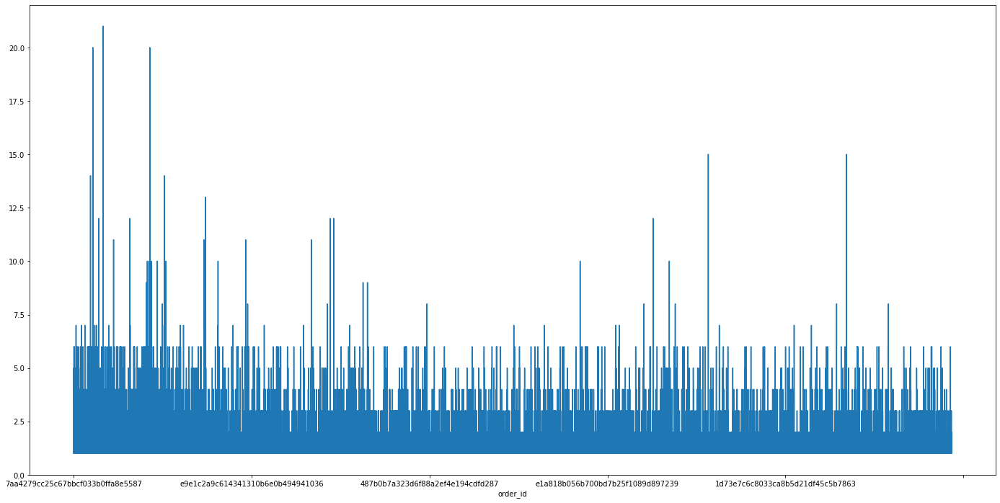

In [32]:
order_prices_n_scores.sort_values('review_score')['item_count'].plot()

# 4. Is there any relation between total price and score?
## R: No

In [54]:
order_prices_n_scores.sort_values('review_score')

,review_score,price,freight_value,item_count,total_price
order_id,,,,,
7aa4279cc25c67bbcf033b0ffa8e5587,1.0,105.00,22.04,1,127.04
2a86b167faca061eb024043376211562,1.0,40.00,17.63,1,57.63
2a873cd8f2f02ea9bf84a5ae74970e20,1.0,168.90,19.06,1,187.96
79fe48b364804e62431c8f465e16f76e,1.0,57.99,24.72,1,82.71
79fe183c2c4f23688615d54004cd3f2d,1.0,59.90,19.61,1,79.51
...,...,...,...,...,...
6c3808960b526766ea7a00ae22c020ab,5.0,439.98,44.67,2,484.65
6c37e2e64af539d44ec739bed4ff2b74,5.0,53.90,0.00,1,53.90
6c352b528099b507dd4b05c4b4c79a06,5.0,69.99,11.73,1,81.72


In [65]:
df = px.data.tips()
df
fig = px.box(df, x="time", y="total_bill")
fig.show()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [ ]:
#order_prices_n_scores.groupby('review_score').mean()
fig = px.box(order_prices_n_scores, x="review_score", y="total_price")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

In [83]:
import plotly.graph_objects as go

fig = go.Figure()
for value in order_prices_n_scores['review_score'].unique():
    if value%int(value) == 0:
        fig.add_trace(go.Box(
            y=order_prices_n_scores[order_prices_n_scores['review_score']==value]['total_price'],
            name=str(value),
#             boxpoints=False, # no data points
#             marker_color='rgb(9,56,125)',
#             line_color='rgb(9,56,125)'
            boxpoints='suspectedoutliers', # only suspected outliers
            marker=dict(
                color='rgb(8,81,156)',
                outliercolor='rgba(219, 64, 82, 0.6)',
                line=dict(
                    outliercolor='rgba(219, 64, 82, 0.6)',
                    outlierwidth=2)),
            line_color='rgb(8,81,156)'
        ))
fig.update_layout(title_text="Box Plot Styling Outliers")
fig.show()

In [56]:
#order_prices_n_scores.sort_values('review_score')['total_price'].plot()
fig = px.scatter(x=order_prices_n_scores['review_score'], y=order_prices_n_scores['total_price'])
fig.show()

In [34]:
data = order_prices_n_scores.iloc[:20,:]
data = data.reset_index().sort_values('total_price',ascending=True)

fig = px.bar(data, x='total_price', y='order_id',orientation='h',
             hover_data=['review_score', 'total_price'], color='review_score',
             labels={'total_price':'Preço total da compra',
                    'index':'Tipo de produto',
                    'review_score':'Estrelas'})

fig.update_layout(
    title_text='Amount of orders, colored by mean of review score.'
)

fig.show()

# Any interesting data?

## R:Yes:
## - Most expensive product: R\\$ 6735.00 (utilidades_domesticas)
## - Least expensive product: R\\$ 0.85 (construcao_ferramentas_construcao)
## - Most expensive order:  R\\$ 13664.08
## - Least expensive order: R\\$ 9.59
## - Most expensive freight: R\\$ 1794.96
## - Least expensive freight: R\\$ 0.00
## - Most expensive total price: R\\$ 13440.00
## - Least expensive total price: R\\$ 0.85
## - Most items bought: 21
## - Least items bought: 1


In [35]:
order_prices_n_scores.describe()

,review_score,price,freight_value,item_count,total_price
count,98666.000000,98666.000000,98666.000000,98666.000000,98666.000000
mean,4.089739,137.754076,22.823562,1.141731,160.577638
std,1.342578,210.645145,21.650909,0.538452,220.466087
min,1.000000,0.850000,0.000000,1.000000,9.590000
25%,4.000000,45.900000,13.850000,1.000000,61.980000
50%,5.000000,86.900000,17.170000,1.000000,105.290000
75%,5.000000,149.900000,24.040000,1.000000,176.870000
max,5.000000,13440.000000,1794.960000,21.000000,13664.080000


In [41]:
order_n_product_class[order_n_product_class['price'] == order_n_product_class['price'].max()]

,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name
order_id,,,,,,,
0812eb902a67711a1cb742b3cdaa65ae,1,489ae2aa008f021502940f251d4cce7f,e3b4998c7a498169dc7bce44e6bb6277,2017-02-16 20:37:36,6735.0,194.31,utilidades_domesticas


In [42]:
order_n_product_class[order_n_product_class['price'] == order_n_product_class['price'].min()]

,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name
order_id,,,,,,,
3ee6513ae7ea23bdfab5b9ab60bffcb5,1,8a3254bee785a526d548a81a9bc3c9be,96804ea39d96eb908e7c3afdb671bb9e,2018-05-04 03:55:26,0.85,18.23,construcao_ferramentas_construcao
6e864b3f0ec71031117ad4cf46b7f2a1,1,8a3254bee785a526d548a81a9bc3c9be,96804ea39d96eb908e7c3afdb671bb9e,2018-05-02 20:30:34,0.85,18.23,construcao_ferramentas_construcao
c5bdd8ef3c0ec420232e668302179113,2,8a3254bee785a526d548a81a9bc3c9be,96804ea39d96eb908e7c3afdb671bb9e,2018-05-07 02:55:22,0.85,22.30,construcao_ferramentas_construcao


In [55]:
order_n_product_class.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000
